<a href="https://colab.research.google.com/github/NoahBarrett98/DL_Learning/blob/master/Content_Loss.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Content Loss
With the use of powerful convolutional neural nets to exract low to high level features from an image. Content loss functions utilize the global properties of an image to determine the accuracy from a ground truth image. 

In [3]:
import tensorflow as tf
import glob
import matplotlib.pyplot as plt
import os
import numpy as np

%matplotlib inline

The data used in this will be samples from the PatternNet dataset

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


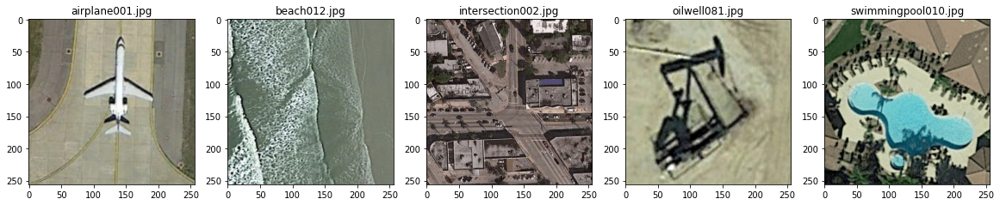

In [11]:
true_samples = glob.glob('/content/drive/My Drive/PatternNet Samples/*')
samples = glob.glob('/content/drive/My Drive/PatternNet Samples/*')

fig, ax = plt.subplots(1, 5, figsize=(20, 100))
for i, s in enumerate(samples):
  
  ax[i].imshow(plt.imread(s))
  ax[i].set_title(os.path.basename(s))

plt.show()

Preprocessing images: Must be 224x224 to be consumed by VGG-19

In [12]:
# preprocess images #
for i, img in enumerate(samples):
  # decode jpg into tensor
  img = tf.convert_to_tensor(img)
  img = tf.io.read_file(img)
  sample = tf.image.decode_jpeg(img, channels=3)
  sample = np.array(sample)[np.newaxis, ...]
  # preprocess to proper dimensions for VGG-19
  sample = tf.image.resize(sample, (224, 224))
  samples[i] = tf.keras.applications.vgg19.preprocess_input(sample)


# VGG-19
The VGG-19 [1] is a very popular choice for the implementation of the content loss function. Most notably, in interest of Super Resolution Ledig et. al [2] utilizes the VGG-19 for the content loss for the SRGAN.

[1] https://arxiv.org/pdf/1409.1556.pdf
[2] https://arxiv.org/pdf/1609.04802.pdf

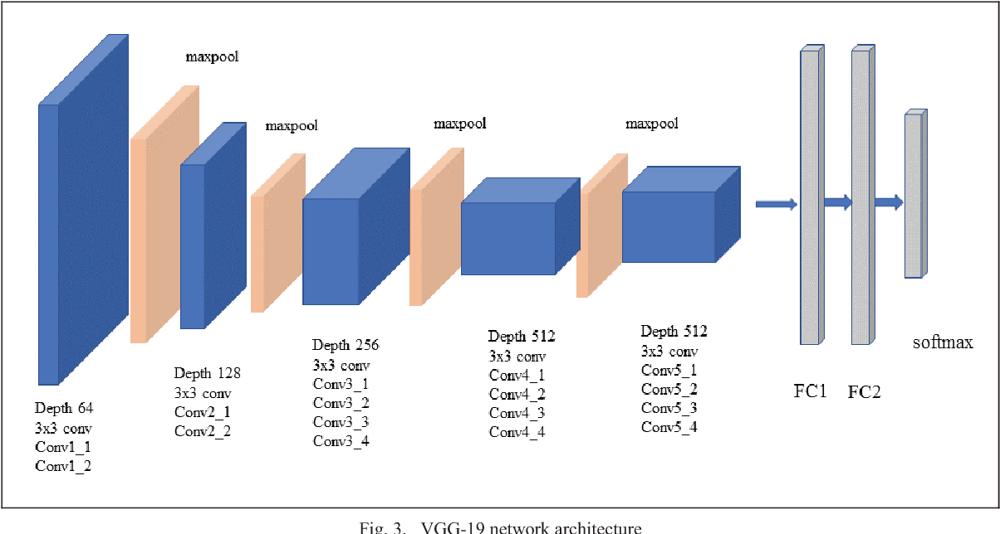

In [13]:
# initilaize the vgg model
base_vgg = tf.keras.applications.VGG19(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=[224, 224, 3],
    pooling=None,
    classes=1000,
    classifier_activation="softmax"
)
# training is set to false as we are exploring it as a feature extractor #
base_vgg.trainable = False
base_vgg.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

# Levels of feature abstraction
Below I will explore the different levels of feature extraction via the different layers of the vgg network

In [34]:
def build_vgg(fe_layers, name):
    outputs = [base_vgg.layers[i].output for i in fe_layers]
    vgg = tf.keras.models.Model([base_vgg.input], outputs)
    vgg._name = name

    return vgg

def feed_through(model):
  outputs = []
  for s in samples:
    # feed through
    output = model(s)
    # the output will contain all layers
    # we are interested in looking at the last layer of output
    # we must also transpose the output to look at layer by layer
    
    outputs.append(tf.transpose(output[-1][0]))

  return outputs

def plot(SAMPLE_IND, outputs):
  """
  plotting 8x8 with all layers for sake of space
  """
  plt.imshow(plt.imread(true_samples[SAMPLE_IND]))

  fig, ax = plt.subplots(8, 8, figsize=(50, 50))
  for i in range(8):
    for j in range(8):
      ax[i, j].imshow(outputs[SAMPLE_IND][i+j])

  plt.show()

Investigating convolution outputs: we will feed through some samples and take  look at what the convolutional layers are picking up on in the images.

# Layer 1:

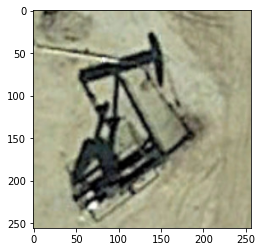

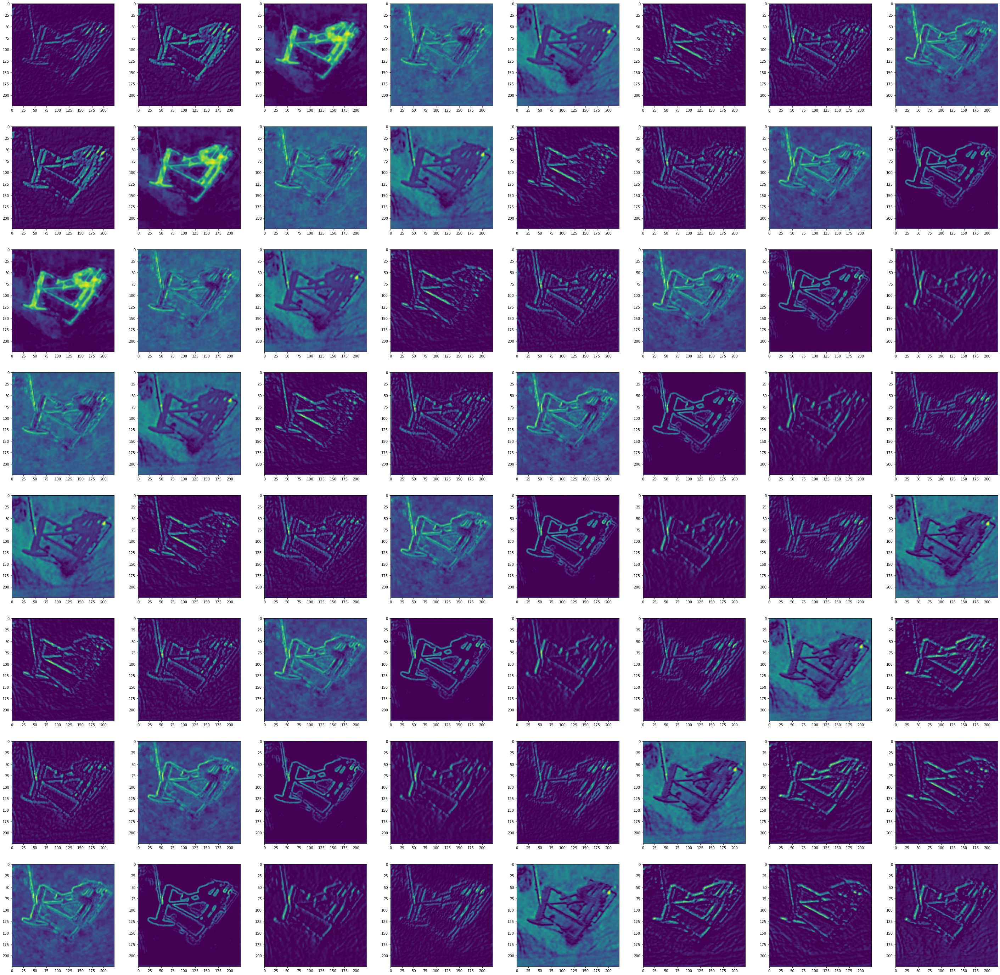

In [32]:
# First layer:
"""
Layer (type)                 Output Shape              Param #   
=================================================================
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
"""
# select layers
fe_layers = [
          0,1,2
]
# build model
first_layer_vgg = build_vgg(fe_layers, name='first level of extraction')

# feed through
outputs_1 = feed_through(first_layer_vgg)

# adjust index to look at different examples
SAMPLE_IND = 3

# visualize the outputs 
plot(SAMPLE_IND, outputs_1)


# Layer 2:

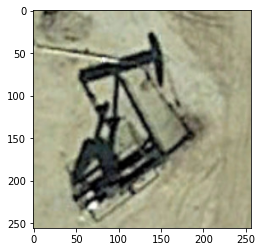

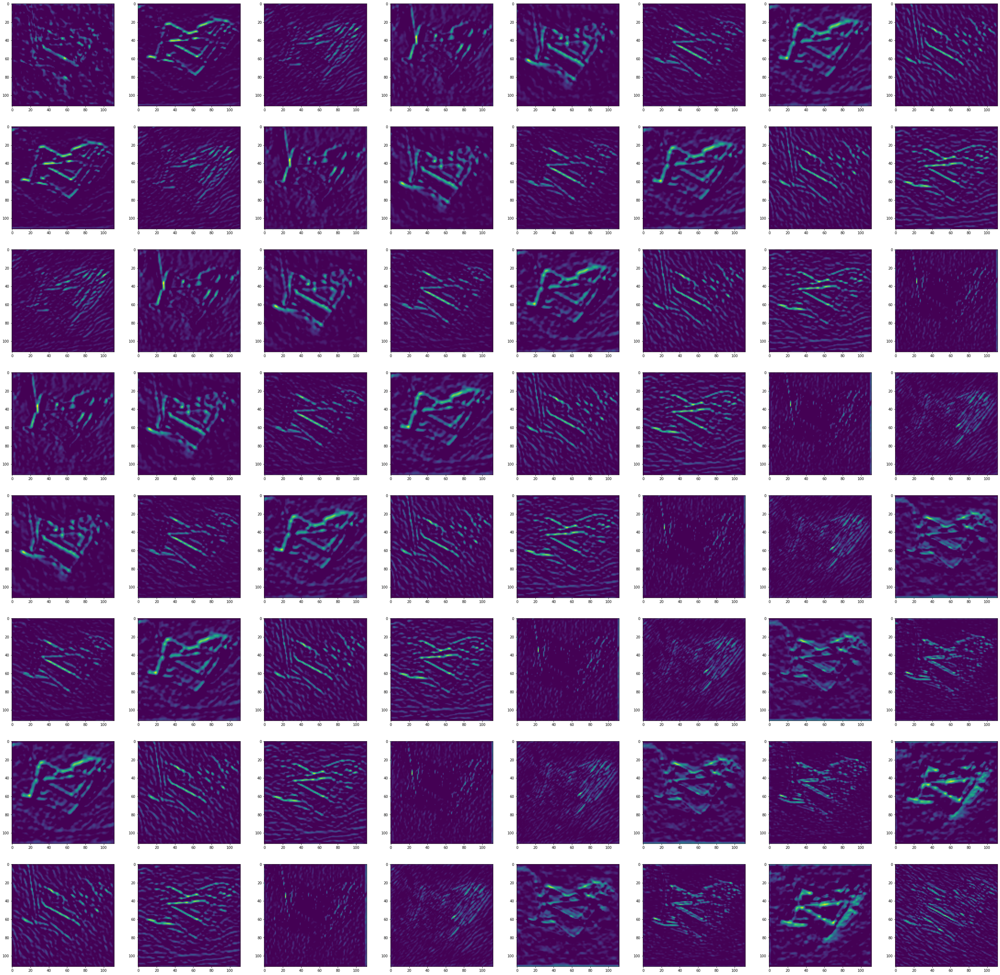

In [35]:
# Second layer:
"""
Layer (type)                 Output Shape              Param #   
=================================================================
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
"""
# select layers
fe_layers = [
          0,1,2,3,4,5
]
# build model
second_layer_vgg = build_vgg(fe_layers, name='second level of extraction')

# feed through
outputs_2 = feed_through(second_layer_vgg)

# adjust index to look at different examples
SAMPLE_IND = 3

# visualize the outputs 
plot(SAMPLE_IND, outputs_2)


Layer 3:

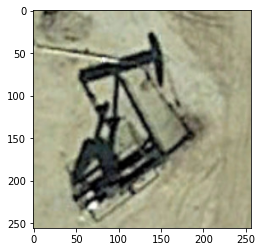

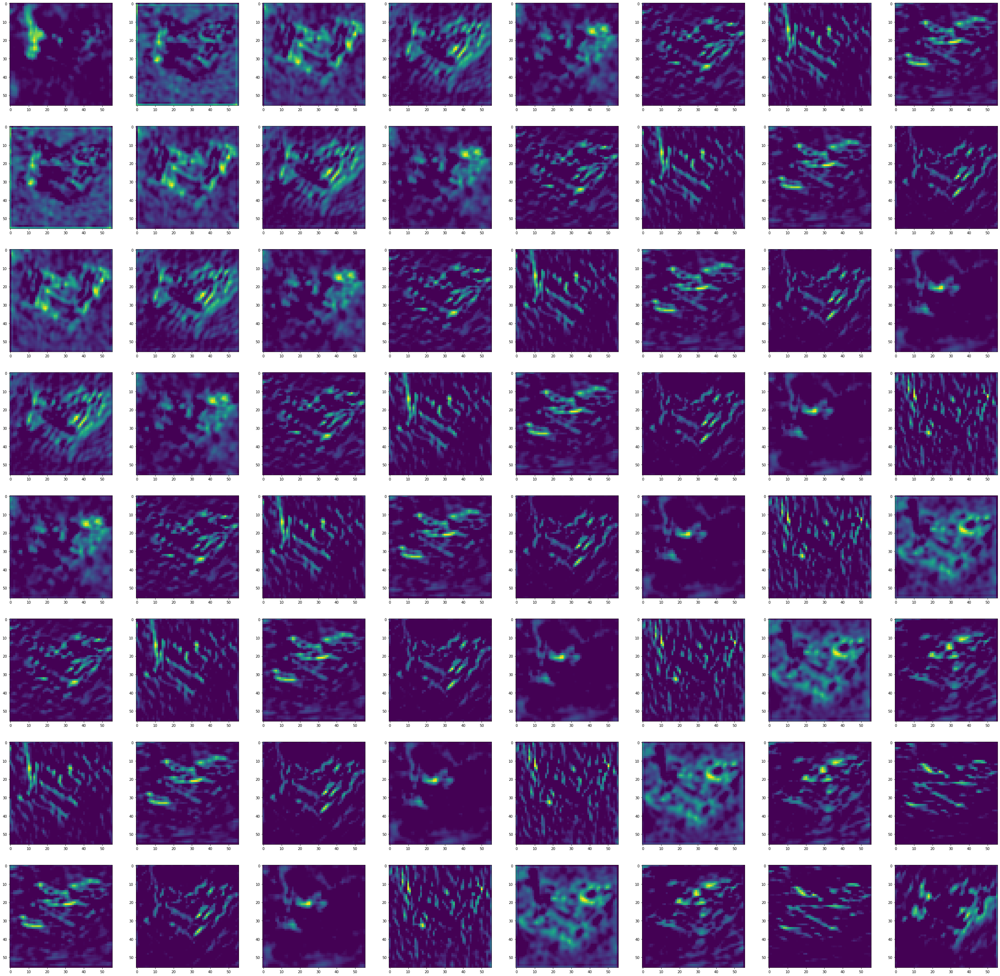

In [36]:
# Third layer:
"""
Layer (type)                 Output Shape              Param #   
=================================================================
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)       295168    
_________________________________________________________________
block3_conv2 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_conv3 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_conv4 (Conv2D)        (None, 56, 56, 256)       590080  
"""
# select layers
fe_layers = [
          0,1,2,3,4,5,6,7,8,9,10
]
# build model
third_layer_vgg = build_vgg(fe_layers, name='third level of extraction')

# feed through
outputs_3 = feed_through(third_layer_vgg)

# adjust index to look at different examples
SAMPLE_IND = 3

# visualize the outputs 
plot(SAMPLE_IND, outputs_3)


# Layer 4:

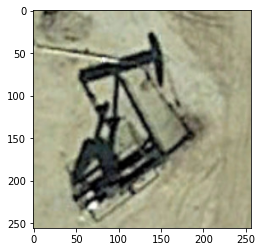

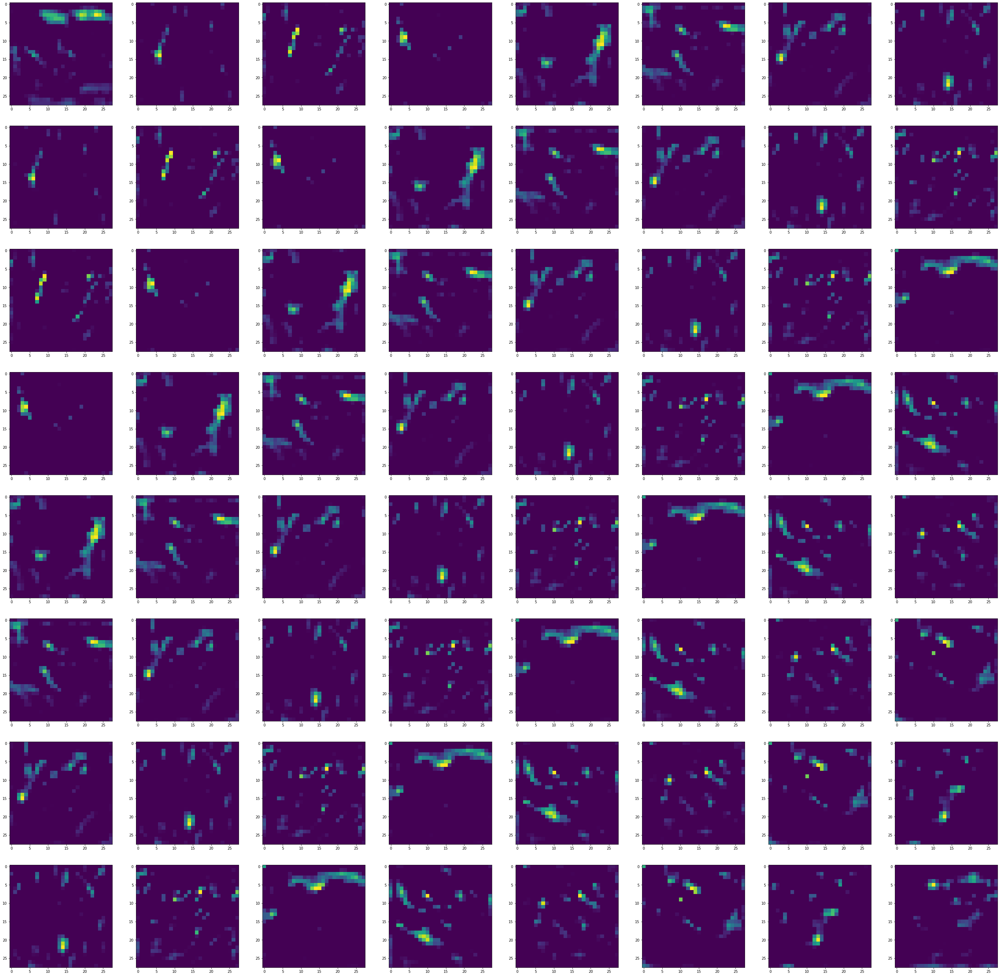

In [37]:
# Fourth layer:
"""
Layer (type)                 Output Shape              Param #   
=================================================================
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)       295168    
_________________________________________________________________
block3_conv2 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_conv3 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_conv4 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_pool (MaxPooling2D)   (None, 28, 28, 256)       0         
_________________________________________________________________
block4_conv1 (Conv2D)        (None, 28, 28, 512)       1180160   
_________________________________________________________________
block4_conv2 (Conv2D)        (None, 28, 28, 512)       2359808   
_________________________________________________________________
block4_conv3 (Conv2D)        (None, 28, 28, 512)       2359808   
_________________________________________________________________
block4_conv4 (Conv2D)        (None, 28, 28, 512)       2359808  
"""
# select layers
fe_layers = [
          0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
]
# build model
fourth_layer_vgg = build_vgg(fe_layers, name='Fourth level of extraction')

# feed through
outputs_4 = feed_through(fourth_layer_vgg)

# adjust index to look at different examples
SAMPLE_IND = 3

# visualize the outputs 
plot(SAMPLE_IND, outputs_4)

# Layer 5: The entire VGG-19 without Top three fully connected layers


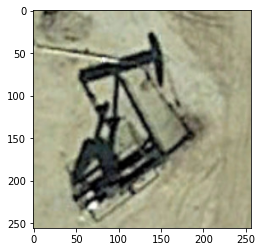

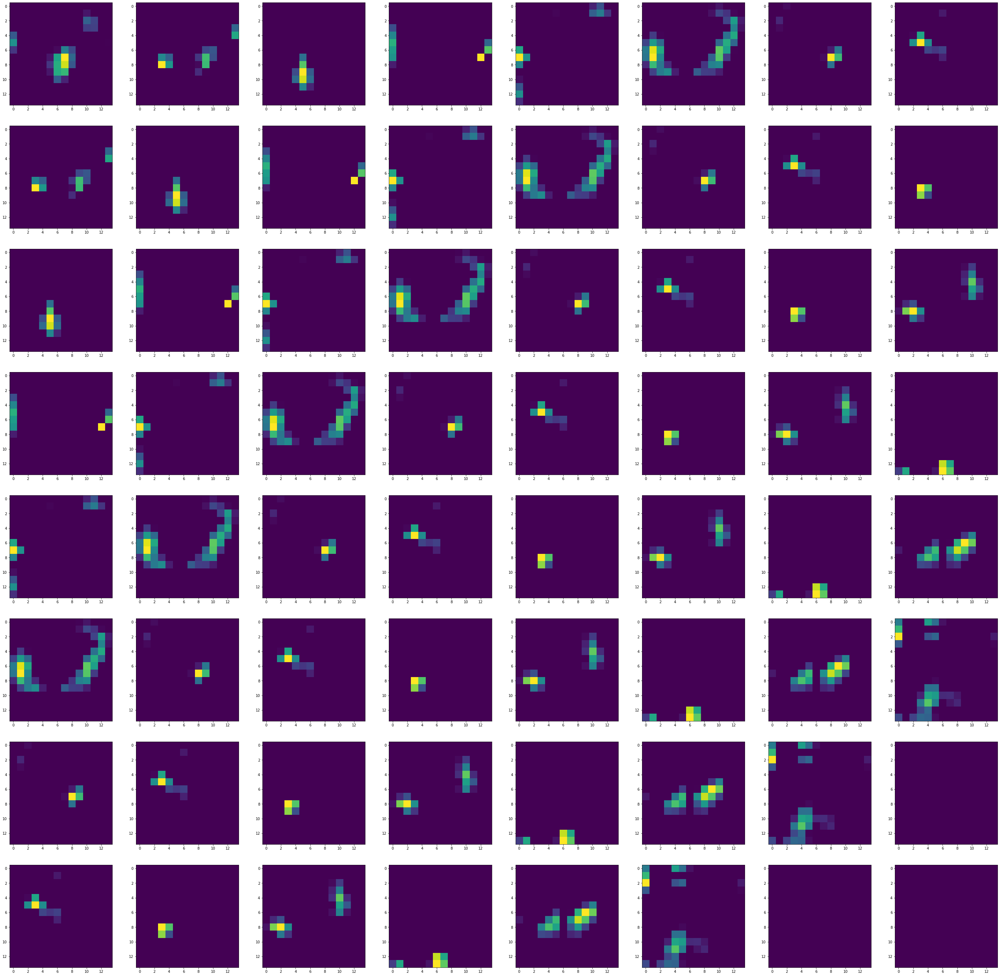

In [38]:
# Fifth layer:
"""
Layer (type)                 Output Shape              Param #   
=================================================================
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)       295168    
_________________________________________________________________
block3_conv2 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_conv3 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_conv4 (Conv2D)        (None, 56, 56, 256)       590080    
_________________________________________________________________
block3_pool (MaxPooling2D)   (None, 28, 28, 256)       0         
_________________________________________________________________
block4_conv1 (Conv2D)        (None, 28, 28, 512)       1180160   
_________________________________________________________________
block4_conv2 (Conv2D)        (None, 28, 28, 512)       2359808   
_________________________________________________________________
block4_conv3 (Conv2D)        (None, 28, 28, 512)       2359808   
_________________________________________________________________
block4_conv4 (Conv2D)        (None, 28, 28, 512)       2359808   
_________________________________________________________________
block4_pool (MaxPooling2D)   (None, 14, 14, 512)       0         
_________________________________________________________________
block5_conv1 (Conv2D)        (None, 14, 14, 512)       2359808   
_________________________________________________________________
block5_conv2 (Conv2D)        (None, 14, 14, 512)       2359808   
_________________________________________________________________
block5_conv3 (Conv2D)        (None, 14, 14, 512)       2359808   
_________________________________________________________________
block5_conv4 (Conv2D)        (None, 14, 14, 512)       2359808   

"""
# select layers
fe_layers = [
          0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
]
# build model
fifth_layer_vgg = build_vgg(fe_layers, name='Fifth level of extraction')

# feed through
outputs_5 = feed_through(fifth_layer_vgg)

# adjust index to look at different examples
SAMPLE_IND = 3

# visualize the outputs 
plot(SAMPLE_IND, outputs_5)

As we can see from those 5 layers, the levels of abstraction get higher and higher through each convolutional blocks. Below we can visualize the 5 different layers. 

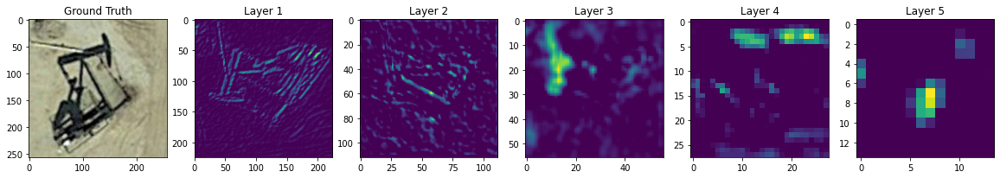

In [42]:
# visualize different levels of the VGG-19
outs = [outputs_1[SAMPLE_IND][0], 
        outputs_2[SAMPLE_IND][0],
        outputs_3[SAMPLE_IND][0],
        outputs_4[SAMPLE_IND][0],
        outputs_5[SAMPLE_IND][0]]

fig, ax = plt.subplots(1, 6, figsize=(20, 100))
ax[0].imshow(plt.imread(true_samples[SAMPLE_IND]))
ax[0].set_title("Ground Truth")
for i, s in enumerate(outs):
  ax[i+1].imshow(s)
  ax[i+1].set_title("Layer {}".format(i+1))

plt.show()

# Content Loss Function:
The output of these different layers allows for a concrete representation of global relationships in the image. Gauging similarities in a Ground Truth Image I and a generated image i can be accomplished by looking at the difference in the output of both images through different convolutional outputs. THe use of pixel loss functions such as L1 or MSE will cause unwanted outcomes such as over smoothing. Incorporating a perceptual aspect to the loss function such as content loss, accomplishes much better results due to its use of feature extraction. 

It is interesting to think... Naturally our eyes take in RGB spectra in which we are able to interpret as meaningful information. So essentially what we are doing with a content loss function is: we are allowing for the incorporation of preliminary understanding of the image, in such a way that meaningful relationships are fused into the gauging of the quality of the input. 
